## Import BeautifulSoup for HTML parsing

In [140]:
from bs4 import BeautifulSoup   #Use Metis Kernal
import requests
import time, os
import itertools
import re
import pickle
import pandas as pd
import numpy as np
import seaborn as sns



In [2]:
from IPython.core.display import display, HTML

### Webdriver stuff setup

In [3]:


from selenium import webdriver
from selenium.webdriver.common.keys import Keys

chromedriver = "/Applications/chromedriver" # path to the chromedriver executable
os.environ["webdriver.chrome.driver"] = chromedriver



## Open chromedriver window thing

In [585]:
driver = webdriver.Chrome(chromedriver)    #Do not rerun everytime, this opens a new window

In [535]:
board_game_url = 'https://boardgamegeek.com/browse/boardgame' 

TEST_12_url = 'https://boardgamegeek.com/browse/boardgame/page/12'
TEST_claustrophobia = 'https://boardgamegeek.com/boardgame/257518/claustrophobia-1643/stats'
driver.get(TEST_claustrophobia)
test_claustrophobia = (BeautifulSoup(driver.page_source, 'html.parser'))

# response = requests.get(board_game_url)

In [4]:

landing_url_list = []

for i in range(1,31):
    landing_url_list.append('https://boardgamegeek.com/browse/boardgame'+'/page/'+str(i))


In [142]:
landing_url_list[:3]

['https://boardgamegeek.com/browse/boardgame/page/1',
 'https://boardgamegeek.com/browse/boardgame/page/2',
 'https://boardgamegeek.com/browse/boardgame/page/3']

## Grabbing 30 landing pages. Run once!!!

In [70]:
# selenium_landing_list_30 = []

# for url in landing_url_list:
#     driver.get(url)
#     selenium_landing_list_30.append(BeautifulSoup(driver.page_source, 'html.parser'))
    
    
#     time.sleep(5)


## Pull URL info into Selenium

In [46]:
driver.get(board_game_url) #only run once per time

In [48]:
selenium_soup = BeautifulSoup(driver.page_source, 'html.parser')

## Function for getting 100 games per page

In [8]:
names_100 = list(range(1,101))

In [55]:

# print(selenium_soup.find_all("span", class_="positive"))
for i,price in enumerate(selenium_soup.find_all(id="row")):
    if price.find("span", class_="positive"):
        print(i, price.find("span", class_="positive").text)
    else:
        print(i, None)


# Final Functions for landing page of first 3000 games

In [85]:
first_3000_ = [] #List of lists of lists: [Game Name, year, url]

def get_100_per_page(page):
    for rank in range(1, 101):
        name_year = page.find(id="results_objectname"+str(rank)).text.strip().split("\n")
        if len(name_year) == 1:
            name_year.append(None)
            
        url = page.find(id="results_objectname"+str(rank)).find('a').get("href")
        
        first_3000_.append([name_year[0], name_year[1], url]) 


In [86]:

price_3000_ = []

def prices_ratings(page):
    for ele in page.find_all(id="row_"):
        try:
            geek_rating = float(ele.find(class_="collection_bggrating").text.strip())
            avg_rating = float(ele.find(class_="collection_bggrating").findNext().text.strip())
            num_voters = int(ele.find(class_="collection_bggrating").findNext().findNext().text.strip())
            rank = ele.find(class_="collection_rank").text.strip() 
            vendor_price = ele.find(class_="ulprice").text.split(":\xa0") 
            
            if vendor_price[1] == '(unavailable)':
                vendor_price[1] = None
            
            
            price_3000_.append([rank, vendor_price[0], vendor_price[1], geek_rating, avg_rating, num_voters])
            
        except AttributeError:
            price_3000_.append([rank, None, None, geek_rating, avg_rating, num_voters])


## Running functions on 30 pages to get info on 3000 games

In [87]:
# len(selenium_landing_list_30) # 30 pages

# for html_page in selenium_landing_list_30:   #around 2 minutes to run
#     get_100_per_page(html_page)
#     prices_ratings(html_page)

In [88]:
all_names_df = pd.DataFrame(first_3000_, columns=(["game", "year", "url"]))
prices_ratings_df = pd.DataFrame(price_3000_, columns=(["rank", "store", "price", "geek_rtg", "avg_rtg", "num_voters"]))



In [89]:
final_landing_df = pd.concat([all_names_df, prices_ratings_df], axis=1)

### Save dataframe of 3000 to csv

In [ ]:
final_landing_df.to_csv ('/Users/derekcall/metis/linear_regression/landing_page_3000.csv', index = True, header=True)

In [90]:
final_landing_df.shape

(3000, 9)

In [93]:
final_landing_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   game        3000 non-null   object 
 1   year        2996 non-null   object 
 2   url         3000 non-null   object 
 3   rank        3000 non-null   object 
 4   store       1840 non-null   object 
 5   price       1422 non-null   object 
 6   geek_rtg    3000 non-null   float64
 7   avg_rtg     3000 non-null   float64
 8   num_voters  3000 non-null   int64  
dtypes: float64(2), int64(1), object(6)
memory usage: 211.1+ KB


In [97]:
# price info missing in all of: 500's, 1200's, 2200's, 2400's, 2500's

start_cleaning_3000 = pd.read_csv('/Users/derekcall/metis/linear_regression/landing_page_3000.csv')


In [98]:
start_cleaning_3000.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  3000 non-null   int64  
 1   game        3000 non-null   object 
 2   year        2996 non-null   object 
 3   url         3000 non-null   object 
 4   rank        3000 non-null   int64  
 5   store       1840 non-null   object 
 6   price       1422 non-null   object 
 7   geek_rtg    3000 non-null   float64
 8   avg_rtg     3000 non-null   float64
 9   num_voters  3000 non-null   int64  
dtypes: float64(2), int64(3), object(5)
memory usage: 234.5+ KB


In [118]:
start_cleaning_3000.rename({"Unnamed: 0":"a"}, axis="columns", inplace=True)

In [119]:
start_cleaning_3000.drop(["a"], axis=1, inplace=True)

In [139]:
start_cleaning_3000.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1422 entries, 0 to 2998
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   game        1422 non-null   object 
 1   year        1422 non-null   object 
 2   url         1422 non-null   object 
 3   rank        1422 non-null   int64  
 4   store       1422 non-null   object 
 5   price       1422 non-null   object 
 6   geek_rtg    1422 non-null   float64
 7   avg_rtg     1422 non-null   float64
 8   num_voters  1422 non-null   int64  
dtypes: float64(2), int64(2), object(5)
memory usage: 111.1+ KB


In [140]:
start_cleaning_3000.to_csv ('/Users/derekcall/metis/linear_regression/clean_3000.csv', index = True, header=True)

In [701]:
start_cleaning_3000.tail(2)

,game,year,url,rank,store,price,geek_rtg,avg_rtg,num_voters
2996,Exit: The Game – The Enchanted Forest,(2020),/boardgame/295944/exit-game-enchanted-forest,2997,Geek Game Shop,$14.95,5.905,7.30,484
2998,Risk: Game of Thrones,(2015),/boardgame/179719/risk-game-thrones,2999,New Amazon,$73.94,5.904,6.72,1439


In [141]:
individual_url_list = start_cleaning_3000['url'].to_list()

In [673]:
type(individual_url_list)

list

In [645]:
individual_url_list[417]

'/boardgame/38996/washingtons-war'

In [681]:
url_df = pd.DataFrame(individual_url_list)

### Use individual_url_list to fetch individual pages + '/stats'


In [158]:
base_url = 'https://boardgamegeek.com'

### all_pages_url_list 

In [495]:
all_pages_list = []

for url in  individual_url_list:
    all_pages_list.append(base_url + url + '/stats')
    


all_pages_list[:5]

['https://boardgamegeek.com/boardgame/174430/gloomhaven/stats',
 'https://boardgamegeek.com/boardgame/161936/pandemic-legacy-season-1/stats',
 'https://boardgamegeek.com/boardgame/224517/brass-birmingham/stats',
 'https://boardgamegeek.com/boardgame/167791/terraforming-mars/stats',
 'https://boardgamegeek.com/boardgame/291457/gloomhaven-jaws-lion/stats']

## Getting list of 1400+ html pages

In [586]:
list_1400_pages = []

In [588]:
# import random

# # list_1400_pages = []

# for i, page in enumerate(all_pages_list):
#     driver.get(page)
#     list_1400_pages.append(BeautifulSoup(driver.page_source, 'html.parser'))
    
#     time.sleep(4+2*random.random())
#     if (i+1 % 200 == 0):
#         time.sleep(320)

In [591]:
len(list_1400_pages)

1422

In [ ]:
driver = webdriver.Chrome(chromedriver)    #Do not rerun everytime, this opens a new window

In [160]:
driver.get(all_pages_list[0])

In [489]:
test_gloom = (BeautifulSoup(driver.page_source, 'html.parser'))

In [600]:

t = []

for item in test_gloom.find_all('ul', {'class': "outline fs-responsive-sm outline-border-col-xs"}):
    for line in item.find_all('li'):
        t.append(line.text.strip().replace('\t', '').split("  "))
             

In [602]:
t

[['Avg. Rating', '', '8.763'],
 ['No. of Ratings', ' 45,720'],
 ['Std. Deviation', ' 1.63'],
 ['Weight', '', '3.87 / 5'],
 ['Comments', ' 8,219'],
 ['Fans', ' 7,661'],
 ['Page Views', ' 10,750,935'],
 ['Overall Rank', '', '1', '', ' Historical Rank'],
 ['Thematic Rank', '', '1', '', ' Historical Rank'],
 ['Strategy Rank', '', '1', '', ' Historical Rank'],
 ['All Time Plays', ' 379,566'],
 ['This Month', ' 2,605'],
 ['Own', ' 74,107'],
 ['Prev. Owned', ' 3,439'],
 ['For Trade', ' 575', 'Find For-Trade Matches'],
 ['Want In Trade', ' 1,377', 'Find Want-in-Trade Matches'],
 ['Wishlist', ' 17,152'],
 ['Has Parts', ' 30'],
 ['Want Parts', ' 16']]

In [617]:
int(test_gloom.find_all(
    class_ = "col-sm-3 col-sm-pull-6")[1].find(
    class_="panel panel-condensed").text.strip().replace('\t', '').strip().split("  ")[4].replace(",", ""))

379566

## Don't write over the dash. Copied direct from page to split on "–"

In [668]:
# make sure to clear it out when running new information so it doesn't just add up
many_features.clear()

many_features = []


In [665]:
# many_features = []

def game_features(link):
    game_type = [0,0]
    try:
        players = int(link.find("ul", {'class': "gameplay"}).find_all('li')[:2][0].get_text().strip().split()[0].split('–')[-1])
        minutes = int(link.find("ul", {'class': "gameplay"}).find_all('li')[:2][1].get_text().strip().split()[0].split('–')[-1])
        min_age = int(link.find("ul", {'class': "gameplay"}).find_all('li')[2].get_text().strip().split()[1].replace('+', ''))
        weight  = float(link.find(class_="c-is-positive ng-binding").text.strip()) 
        page_views = int(link.find_all(class_="outline-item-description ng-binding")[1].text.strip().replace(",", ""))
        std_dev =  float(link.find_all(class_="outline-item-description ng-binding")[0].text.strip())
        all_plays = int(link.find_all(class_ = "col-sm-3 col-sm-pull-6")[1].find(class_="panel panel-condensed").text.strip().replace('\t', '').strip().split("  ")[4].replace(",", ""))
        this_month = int(link.find_all(class_ = "col-sm-3 col-sm-pull-6")[1].find(class_="panel panel-condensed").text.strip().replace('\t', '').strip().split("  ")[7].replace(",", ""))

        for item in link.find_all('ul', {'class': "outline fs-responsive-sm outline-border-col-xs"})[1].find_all('li')[1:]:
            if item.text.strip().split()[0] == "Thematic":
                game_type[0] = 1    #dummy for Thematic
            elif item.text.strip().split()[0] == "Strategy":
                game_type[1] = 1    #dummy for Strategy
            else:
                pass


        many_features.append(
            [players, minutes, min_age, weight, page_views, std_dev, game_type[0], game_type[1], all_plays, this_month]
                            )
    except ValueError:
        many_features.append(
        [None, None, None, None, None, None, None, None, None, None]
                            )
            
# game_features(test_gloom)

In [672]:
len(many_features)


1422

In [674]:
url_1422_df = pd.DataFrame([individual_url_list])

In [691]:
df_1422 = pd.concat([info_1422_df, url_df], axis=1)


In [688]:
column_names = ["players", "minutes", "age", "weight", "page_views", "std_dev", "thematic", "strategic", "all_plays", "this_month", "url"]

In [692]:
df_1422.columns = column_names

In [694]:
df_1422.dropna(inplace=True)

In [699]:
df_1422.to_csv ('/Users/derekcall/metis/linear_regression/final_scrape_1422.csv', index = True, header=True)

In [702]:
merged_1422_df = start_cleaning_3000.merge(df_1422, left_on='url', right_on='url')

In [706]:
merged_1422_df.to_csv ('/Users/derekcall/metis/linear_regression/merged_final_1422.csv', index = True, header=True)

In [707]:
merged_1422_df.tail(10)

,game,year,url,rank,store,price,geek_rtg,avg_rtg,num_voters,players,minutes,age,weight,page_views,std_dev,thematic,strategic,all_plays,this_month
1396,Midgard,(2007),/boardgame/23985/midgard,2983,New Amazon,$64.99,5.907,6.57,1004,5.0,60.0,12.0,2.37,196580.0,1.16,0.0,1.0,1700.0,3.0
1397,Rolling Freight,(2012),/boardgame/74390/rolling-freight,2985,New Amazon,$66.48,5.907,6.81,738,5.0,180.0,13.0,3.00,139820.0,1.35,0.0,1.0,1407.0,2.0
1398,Starship Samurai,(2018),/boardgame/245357/starship-samurai,2987,New Amazon,$49.85,5.907,7.06,643,4.0,75.0,14.0,2.50,161161.0,1.44,0.0,0.0,998.0,9.0
1399,Amul,(2019),/boardgame/260710/amul,2989,New Amazon,$24.76,5.906,6.96,647,8.0,45.0,10.0,2.13,88498.0,1.16,0.0,0.0,1586.0,20.0
1400,The Shores of Tripoli,(2020),/boardgame/237860/shores-tripoli,2990,New Amazon,$66.00,5.905,7.96,403,2.0,60.0,12.0,2.13,112210.0,1.40,0.0,0.0,1249.0,30.0
1401,Adventure Tactics: Domianne's Tower,(2021),/boardgame/268504/adventure-tactics-domiannes-...,2992,New Amazon,$77.74,5.905,8.17,343,5.0,90.0,10.0,2.55,131381.0,1.40,0.0,0.0,1974.0,44.0
1402,Asia Engulfed,(2007),/boardgame/20609/asia-engulfed,2993,New Amazon,$139.95,5.905,7.57,426,2.0,480.0,12.0,3.80,197423.0,1.49,0.0,0.0,480.0,0.0
1403,Railways of Nippon,(2018),/boardgame/214988/railways-nippon,2995,New Amazon,$62.99,5.905,7.69,368,4.0,120.0,12.0,2.33,68127.0,1.30,0.0,0.0,858.0,3.0
1404,Exit: The Game – The Enchanted Forest,(2020),/boardgame/295944/exit-game-enchanted-forest,2997,Geek Game Shop,$14.95,5.905,7.30,484,4.0,90.0,12.0,2.00,17441.0,1.26,0.0,0.0,763.0,20.0
1405,Risk: Game of Thrones,(2015),/boardgame/179719/risk-game-thrones,2999,New Amazon,$73.94,5.904,6.72,1439,7.0,240.0,18.0,2.82,350286.0,1.57,1.0,0.0,1146.0,5.0


In [708]:
merged_1422_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1406 entries, 0 to 1405
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   game        1406 non-null   object 
 1   year        1406 non-null   object 
 2   url         1406 non-null   object 
 3   rank        1406 non-null   int64  
 4   store       1406 non-null   object 
 5   price       1406 non-null   object 
 6   geek_rtg    1406 non-null   float64
 7   avg_rtg     1406 non-null   float64
 8   num_voters  1406 non-null   int64  
 9   players     1406 non-null   float64
 10  minutes     1406 non-null   float64
 11  age         1406 non-null   float64
 12  weight      1406 non-null   float64
 13  page_views  1406 non-null   float64
 14  std_dev     1406 non-null   float64
 15  thematic    1406 non-null   float64
 16  strategic   1406 non-null   float64
 17  all_plays   1406 non-null   float64
 18  this_month  1406 non-null   float64
dtypes: float64(12), int64(2), o

In [9]:
merged_1422_df = pd.read_csv('/Users/derekcall/metis/linear_regression/merged_final_1422.csv')

In [10]:
merged_1422_df['year'] = merged_1422_df['year'].map(lambda x: x.lstrip('(').rstrip(')'))
# convert string to an integer
merged_1422_df['year'] = merged_1422_df['year'].astype(int)

In [11]:

merged_1422_df['price'] = merged_1422_df['price'].map(lambda x: x.lstrip('$').rstrip("\n\t"))
merged_1422_df = merged_1422_df[merged_1422_df['price'] != 'To low to display'].copy()
merged_1422_df['price'] = merged_1422_df['price'].astype(float)
merged_1422_df['them*strat'] = merged_1422_df['thematic']*merged_1422_df['strategic']

In [12]:
merged_1422_df['intercept'] = 1
merged_1422_df = merged_1422_df[merged_1422_df['minutes']<600]

In [143]:
data_minus_identifiers['price'].sort_values().tail(10)

708     389.95
635     399.95
354     399.99
774     399.99
1358    419.99
270     449.95
527     449.95
1176    499.99
558     599.99
839     699.99
Name: price, dtype: float64

In [14]:
merged_1422_df = merged_1422_df[merged_1422_df['players']<13]
merged_1422_df = merged_1422_df[merged_1422_df['year']>1940]

In [15]:
data_minus_identifiers = merged_1422_df[["intercept", "game","price", "year","rank",
                "geek_rtg", "avg_rtg", "std_dev", "num_voters", "players", 
                "minutes", "age", "weight", "page_views", "thematic", "strategic", 
                "them*strat", "all_plays", "this_month"]].copy()

In [16]:
data_minus_identifiers.describe()

,intercept,price,year,rank,geek_rtg,avg_rtg,std_dev,num_voters,players,minutes,age,weight,page_views,thematic,strategic,them*strat,all_plays,this_month
count,1372.0,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000,1.372000e+03,1372.000000,1372.000000,1372.000000,1372.000000,1372.000000
mean,1.0,66.092515,2012.883382,1244.104227,6.575245,7.269278,1.346501,6775.056122,4.523324,80.560496,11.513120,2.465262,5.395137e+05,0.187318,0.474490,0.043732,25550.913265,219.188776
std,0.0,65.767820,8.000243,855.665146,0.522592,0.492442,0.164119,11252.321342,1.606936,61.224092,2.289857,0.768483,7.490850e+05,0.390309,0.499531,0.204572,56940.131705,554.932619
min,1.0,5.120000,1946.000000,1.000000,5.904000,6.100000,1.000000,298.000000,1.000000,5.000000,2.000000,1.000000,1.744100e+04,0.000000,0.000000,0.000000,462.000000,0.000000
25%,1.0,29.990000,2010.000000,454.750000,6.171000,6.910000,1.220000,1403.500000,4.000000,45.000000,10.000000,1.937500,1.647155e+05,0.000000,0.000000,0.000000,3383.000000,15.000000
50%,1.0,45.850000,2015.000000,1117.500000,6.469500,7.240000,1.320000,2700.000000,4.000000,60.000000,12.000000,2.400000,2.910260e+05,0.000000,0.000000,0.000000,7621.500000,50.000000
75%,1.0,73.982500,2018.000000,1856.250000,6.941000,7.600000,1.440000,7221.000000,5.000000,100.000000,13.000000,2.952500,5.984092e+05,0.000000,1.000000,0.000000,22061.500000,177.000000
max,1.0,699.990000,2021.000000,2999.000000,8.528000,8.860000,2.840000,106463.000000,12.000000,480.000000,18.000000,4.790000,1.075094e+07,1.000000,1.000000,1.000000,706597.000000,8892.000000


In [886]:
# data_minus_identifiers['thematic'].sum() #257
# data_minus_identifiers['strategic'].sum()  #651
# data_minus_identifiers['them*strat'].sum() #60
# print(1373 -(651 + 257 - 60))   #Other = 525

525


In [18]:
# Necessary imports
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression

import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_formats = ['svg']  # or svg
%matplotlib inline

sns.set(context='notebook', style='whitegrid', font_scale=1.2)

In [21]:

import pandas as pd
import seaborn as sns
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge 
from sklearn.preprocessing import StandardScaler, PolynomialFeatures



# Cleaned data - for use in modeling - train_test_split

In [37]:
data_minus_identifiers.to_csv ('/Users/derekcall/metis/linear_regression/final_clean_game_df.csv', index = True, header=True)

In [581]:
final_cleaned_df = pd.read_csv('/Users/derekcall/metis/linear_regression/final_clean_game_df.csv')

In [583]:
final_cleaned_df.sort_values('weight', ascending=False).head(20)

,Unnamed: 0,intercept,game,price,year,rank,geek_rtg,avg_rtg,std_dev,num_voters,players,minutes,age,weight,page_views,thematic,strategic,them*strat,all_plays,this_month
816,835,1,High Frontier 4 All,70.00,2020,1433,6.314,8.66,1.64,646,5.0,240.0,14.0,4.79,301871.0,1.0,1.0,1.0,2349.0,110.0
266,273,1,Advanced Squad Leader,29.99,1985,342,7.070,7.99,2.06,3554,2.0,480.0,14.0,4.73,1141157.0,0.0,0.0,0.0,17051.0,64.0
47,48,1,On Mars,107.99,2020,54,7.698,8.28,1.49,7154,4.0,150.0,14.0,4.64,1268119.0,0.0,1.0,0.0,17506.0,319.0
376,385,1,Feudum,119.96,2017,604,6.795,7.66,1.76,2974,5.0,180.0,12.0,4.59,640708.0,0.0,1.0,0.0,5561.0,65.0
51,52,1,Lisboa,129.99,2017,61,7.672,8.21,1.43,7461,4.0,120.0,12.0,4.56,971483.0,0.0,1.0,0.0,17852.0,208.0
1328,1362,1,Pax Emancipation,35.73,2018,2899,5.922,7.63,1.72,412,3.0,120.0,14.0,4.53,172991.0,1.0,1.0,1.0,1064.0,19.0
840,861,1,Bios:Megafauna (Second Edition),59.06,2017,1491,6.293,7.72,1.54,974,4.0,180.0,12.0,4.48,251428.0,1.0,1.0,1.0,2342.0,17.0
832,852,1,Pendragon: The Fall of Roman Britain,52.41,2017,1474,6.298,8.00,1.52,834,4.0,360.0,16.0,4.44,315563.0,0.0,0.0,0.0,1398.0,6.0
8,8,1,Through the Ages: A New Story of Civilization,59.61,2015,9,8.162,8.40,1.51,24691,4.0,120.0,14.0,4.41,2963562.0,0.0,1.0,0.0,91909.0,896.0
961,988,1,Bios:Genesis,43.75,2016,1750,6.204,7.12,1.69,1329,4.0,120.0,12.0,4.39,362323.0,1.0,0.0,0.0,3346.0,22.0


## testing for y = weight: x = [intercept, price, year, avg_rtg, minutes, thematic, strategic, this month]

In [574]:
x_features = final_cleaned_df.loc[:, ['intercept','price','year', 'avg_rtg',
                     'minutes', "thematic", 
                    "strategic", "this_month"]]

y_features = final_cleaned_df.loc[:,['weight']]

In [313]:
regression_features = ['intercept','price', 'avg_rtg','minutes', "thematic", "strategic"]


## For OLS regression - To keep column names

In [654]:
x_features = final_cleaned_df[['intercept','price', 'avg_rtg',
                     'minutes', "thematic", 
                    "strategic"]]

y_features = final_cleaned_df[['weight']]

## Adding polynomial terms manually

In [655]:
final_cleaned_df['price_sq']  = final_cleaned_df['price']**2  
final_cleaned_df['avg_rtg_sq'] =  final_cleaned_df['avg_rtg']**2
final_cleaned_df['avg_rtg_sqrt'] =  final_cleaned_df['avg_rtg']**(1/2)
final_cleaned_df['minutes_sq']  = final_cleaned_df['minutes']**2
final_cleaned_df['minutes_sqrt']  = final_cleaned_df['minutes']**(1/2)
final_cleaned_df['minutes_4th_rt']  = final_cleaned_df['minutes']**(1/4)


## Best model includes minutes_sqrt - As determined by pairplot and r2

In [656]:
manual_poly_x = final_cleaned_df[['intercept','geek_rtg', 'strategic','minutes','minutes_sqrt',
                                  'price','year', 'players', 'age']]
manual_y = final_cleaned_df[['weight']]

In [657]:
manual_poly_x, x_poly_test, manual_y, y_poly_test = train_test_split(manual_poly_x, manual_y, test_size=0.2, random_state=45)

## K-fold cross validation - split train and test data

In [149]:
from sklearn.model_selection import KFold

In [431]:
from sklearn.model_selection import KFold

x_features, x_test, y_features, y_test = train_test_split(x_features, y_features, test_size=0.2, random_state=45)


In [624]:
#this helps with the way kf will generate indices below
x_features, y_features = np.array(x_features), np.array(y_features)
manual_poly_x, manual_y = np.array(manual_poly_x), np.array(manual_y)

## Checking for best alpha value for function

In [474]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

def mae(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true)) 

In [129]:

alphalist = 10**(np.linspace(-2,2,200))
err_vec_val = np.zeros(len(alphalist))
err_vec_train = np.zeros(len(alphalist))

for i,curr_alpha in enumerate(alphalist):

    # note the use of a new sklearn utility: Pipeline to pack
    # multiple modeling steps into one fitting process 
    steps = [('standardize', StandardScaler()), 
             ('ridge', Ridge(alpha = curr_alpha))]

    pipe = Pipeline(steps)
    pipe.fit(x_train, y_train)
    
    val_set_pred = pipe.predict(x_val)
    err_vec_val[i] = mae(y_val, val_set_pred)

In [132]:
print(np.min(err_vec_val))
print(alphalist[np.argmin(err_vec_val)])

0.2962464586812266
0.01


## K-fold validation in 5 groups, ran 100 times with different random_states

In [627]:
cv_lm_r2s, cv_lm_reg_r2s, cv_lm_poly_r2s = [], [], [] #collect the validation results for both models

In [364]:
from sklearn.linear_model import Lasso


## Re-initialize lists (above) to run model cleanly

In [628]:
#run the CV
for runs in range(0,100):
    kf = KFold(n_splits=5, shuffle=True, random_state = runs)
# cv_lm_r2s, cv_lm_reg_r2s, cv_lm_poly_r2s = [], [], [] #collect the validation results for both models


    for train_ind, val_ind in kf.split(manual_poly_x, manual_y):

        x_train, y_train = manual_poly_x[train_ind], manual_y[train_ind]
        x_val, y_val = manual_poly_x[val_ind], manual_y[val_ind] 


        #simple linear regression
        lm = LinearRegression()
        lm_reg = Ridge(alpha=0.01)     # Change alpha from lecture from Monday
        lm_poly = LinearRegression()


        lm.fit(x_train, y_train)
        cv_lm_r2s.append(lm.score(x_val, y_val).round(3))

        #ridge with feature scaling
        scaler = StandardScaler()
        x_train_scaled = scaler.fit_transform(x_train)
        x_val_scaled = scaler.transform(x_val)

        lm_reg.fit(x_train_scaled, y_train)
        cv_lm_reg_r2s.append(lm_reg.score(x_val_scaled, y_val).round(3))

        #polynomial regression degree 2
        poly = PolynomialFeatures(degree=2)
        x_train_poly = poly.fit_transform(x_train)
        x_val_poly = poly.transform(x_val)

        lm_poly.fit(x_train_poly, y_train)
        cv_lm_poly_r2s.append(lm_poly.score(x_val_poly, y_val).round(3))


#     print(f'Simple scores: \t\t{cv_lm_r2s}')
#     print(f'Ridge scores: \t\t{cv_lm_reg_r2s}')
#     print(f'Polynomial scores: \t{cv_lm_poly_r2s} \n')

print(f'Simple mean cv r^2: \t{np.mean(cv_lm_r2s):.3f} +- {np.std(cv_lm_r2s):.3f}')
print(f'Ridge mean cv r^2: \t{np.mean(cv_lm_reg_r2s):.3f} +- {np.std(cv_lm_reg_r2s):.3f}')
print(f'Polynomial mean cv r^2: {np.mean(cv_lm_poly_r2s):.3f} +- {np.std(cv_lm_poly_r2s):.3f}')

Simple mean cv r^2: 	0.744 +- 0.028
Ridge mean cv r^2: 	0.744 +- 0.028
Polynomial mean cv r^2: 0.739 +- 0.061


In [626]:
print(len(cv_lm_poly_r2s))

1000


## Best model performance:

The simple mean regression was best. The ridge regression never improved when increasing alpha.
The adjusted R2 of the OLS model is 0.740 (non-adjusted 7.41) - Test with validation data is a 
mean of R2 = 0.735 (500 random trials) - 
Will test with Testing data now - 

## Choosing alpha = 0.003 - Not using Lasso model, did not perform better

In [479]:

# # Don't forget to standard scale your data for regularized regression
# scaler = StandardScaler()
# x_train_poly_scaled = scaler.fit_transform(x_train_poly)

# # Apply the same scaler to val set
# x_val_poly_scaled = scaler.transform(x_val_poly)

# # Fit a LASSO model using polynomial features for various alphas
# print("\t\tTrain\tTest")

# alphas = [0.05, 0.045, 0.04, 0.035, 0.03, 0.025, 0.02, 0.015, 0.01, 0.0015, .002, .003, .004, .005, .006, .007, .008, .009]
# for alpha in alphas:
#     lasso = Lasso(alpha=alpha)
#     lasso.fit(x_train_poly_scaled,y_train)
#     print(f"alpha={alpha}: \t{lasso.score(x_train_poly_scaled,y_train):.4f} \t{lasso.score(x_val_poly_scaled,y_val):.4f}")

In [480]:
# lasso=Lasso(alpha=0.003)
# lasso.fit(x_train_poly_scaled,y_train)

In [481]:
# list(zip(polynomial_features.get_feature_names(['x0', 'x1','x2','x3','x4']),lasso.coef_))

In [484]:
# # Fit a LASSO model on full dataset using scaled, polynomial features
# poly = PolynomialFeatures(degree=2)
# x_poly = poly.fit_transform(x_features)

# scaler = StandardScaler()
# x_poly_scaled = scaler.fit_transform(x_poly)

# lasso = Lasso(alpha=0.003)
# lasso.fit(x_poly_scaled,y_features)

# # Apply the same polynomial and scaling transformations to test set, then score
# x_test_poly = poly.transform(x_test)
# x_test_poly_scaled = scaler.transform(x_test_poly)

# lasso.score(x_test_poly_scaled, y_test)

# This is best model, with minutes_sqrt (thematic was not significant)

In [609]:
import statsmodels.api as sm

model = sm.OLS(manual_y, manual_poly_x).fit()
ypred = model.predict(manual_poly_x) 

ypred.shape

(1097,)

In [610]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 weight   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     410.2
Date:                Thu, 30 Sep 2021   Prob (F-statistic):          4.05e-322
Time:                        13:42:38   Log-Likelihood:                -501.21
No. Observations:                1097   AIC:                             1020.
Df Residuals:                    1088   BIC:                             1065.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
intercept       -5.7776      2.960     -1.952      0.051     -11.585       0.030
geek_rtg         0.1069      0.023      4.609      0.000       0.061       0.152
strategic        0.3136      0.026     12.225      0.000       0.263       0.364
minutes         -0.0055      0.001     -6.721      0.000      -0.007      -0.004
minutes_sqrt     0.2743      0.018     15.531      0.000       0.240       0.309
price            0.0007      0.000      3.505      0.000       0.000       0.001
year             0.0027      0.001      1.802      0.072      -0.000       0.006
players         -0.0706      0.007     -9.893      0.000      -0.085      -0.057
age              0.0353      0.006      5.904      0.000       0.024       0.047
==============================================================================
Omnibus:                       64.657   Durbin-Watson:                   1.919
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               95.875
Skew:                           0.486   Prob(JB):                     1.52e-21
Kurtosis:                       4.074   Cond. No.                     5.15e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.15e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<AxesSubplot:xlabel='minutes_sqrt', ylabel='weight'>

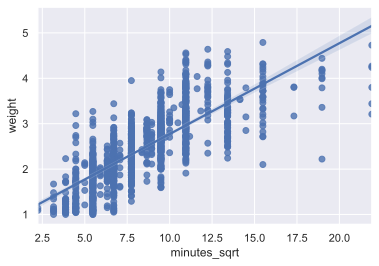

In [470]:
sns.regplot(x='minutes_sqrt', y='weight', data= final_cleaned_df)

<AxesSubplot:xlabel='minutes', ylabel='Count'>

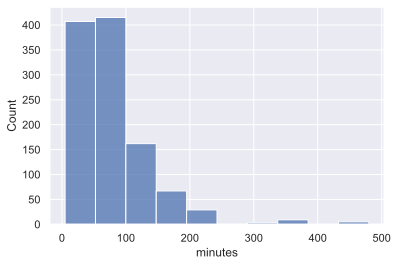

In [601]:
sns.histplot(manual_poly_x['minutes'], bins=10)

/var/folders/vb/ws02q5dj7f359ww21qf5ysn80000gn/T/ipykernel_32559/664584704.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_features['Predictions']= model.predict(manual_poly_x)
/var/folders/vb/ws02q5dj7f359ww21qf5ysn80000gn/T/ipykernel_32559/664584704.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_features['actual_y'] = y_features
/var/folders/vb/ws02q5dj7f359ww21qf5ysn80000gn/T/ipykernel_32559/664584704.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a D

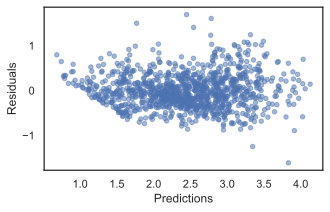

In [658]:
# model = sm.OLS(y_features, x_features[['intercept','price', 'avg_rtg',
#                      'minutes', 'minutes_sqrt' "thematic", "strategic"]])



# fit = model.fit()
# fit.summary()


# create residual plot
x_features['Predictions']= model.predict(manual_poly_x)
x_features['actual_y'] = y_features
x_features['Residuals'] = x_features.actual_y - x_features.Predictions
with sns.axes_style('white'):
    plot = x_features.plot(
        kind='scatter', x='Predictions', y='Residuals', alpha=0.5, figsize=(5,3))
    
    


# print(fit.summary())

In [663]:
%matplotlib inline
pair_games=sns.pairplot(final_cleaned_df[['price', 'geek_rtg',
                     'minutes', 'minutes_sqrt', 'year',
                    'age', 'players' ,'weight']]);



In [665]:
pair_games.savefig('pair_data.jpeg')

In [892]:
data_minus_identifiers[data_minus_identifiers['thematic'] == 1].describe()

,intercept,price,year,rank,geek_rtg,avg_rtg,std_dev,num_voters,players,minutes,age,weight,page_views,thematic,strategic,them*strat,all_plays,this_month
count,257.0,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,2.570000e+02,257.0,257.000000,257.000000,257.000000,257.000000
mean,1.0,101.247743,2013.700389,1132.357977,6.648444,7.393580,1.478833,6277.817121,4.836576,107.167315,12.863813,2.710350,7.854991e+05,1.0,0.233463,0.233463,18381.361868,139.400778
std,0.0,100.795366,7.093111,833.327032,0.556694,0.551314,0.185563,8138.813656,1.443109,59.698520,1.670322,0.643344,1.038918e+06,0.0,0.423860,0.423860,35864.017513,337.578508
min,1.0,9.990000,1962.000000,1.000000,5.904000,6.200000,1.120000,412.000000,2.000000,15.000000,7.000000,1.380000,3.556300e+04,1.0,0.000000,0.000000,811.000000,0.000000
25%,1.0,39.110000,2012.000000,381.000000,6.214000,6.980000,1.370000,1444.000000,4.000000,60.000000,12.000000,2.240000,2.513780e+05,1.0,0.000000,0.000000,3089.000000,11.000000
50%,1.0,66.990000,2015.000000,995.000000,6.537000,7.370000,1.460000,3074.000000,5.000000,90.000000,13.000000,2.620000,4.214490e+05,1.0,0.000000,0.000000,6387.000000,34.000000
75%,1.0,118.700000,2018.000000,1712.000000,7.027000,7.760000,1.570000,7871.000000,6.000000,120.000000,14.000000,3.140000,9.426800e+05,1.0,0.000000,0.000000,19432.000000,109.000000
max,1.0,699.990000,2021.000000,2999.000000,8.528000,8.860000,2.840000,45707.000000,10.000000,480.000000,18.000000,4.790000,1.075094e+07,1.0,1.000000,1.000000,379566.000000,2605.000000


In [894]:
data_minus_identifiers[data_minus_identifiers['strategic'] == 1].describe()

,intercept,price,year,rank,geek_rtg,avg_rtg,std_dev,num_voters,players,minutes,age,weight,page_views,thematic,strategic,them*strat,all_plays,this_month
count,651.0,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,6.510000e+02,651.000000,651.0,651.000000,651.000000,651.000000
mean,1.0,68.467051,2013.066052,1060.591398,6.697515,7.366989,1.332043,7237.729647,4.334869,92.437788,12.135177,2.844531,6.163975e+05,0.092166,1.0,0.092166,25473.509985,224.364055
std,0.0,50.726400,7.123111,821.564758,0.565788,0.480493,0.152239,12246.972404,1.114242,57.207722,1.638998,0.636050,8.749341e+05,0.289482,0.0,0.289482,60840.532700,608.309113
min,1.0,10.990000,1959.000000,1.000000,5.907000,6.260000,1.000000,412.000000,1.000000,15.000000,7.000000,1.500000,4.961900e+04,0.000000,1.0,0.000000,480.000000,0.000000
25%,1.0,39.870000,2010.000000,313.500000,6.230000,7.010000,1.220000,1578.000000,4.000000,60.000000,12.000000,2.330000,1.910660e+05,0.000000,1.0,0.000000,3411.000000,13.000000
50%,1.0,51.990000,2015.000000,912.000000,6.586000,7.340000,1.310000,2882.000000,4.000000,90.000000,12.000000,2.780000,3.198130e+05,0.000000,1.0,0.000000,7336.000000,45.000000
75%,1.0,75.300000,2018.000000,1665.500000,7.097000,7.680000,1.425000,7499.500000,5.000000,120.000000,14.000000,3.240000,6.478890e+05,0.000000,1.0,0.000000,20208.000000,167.000000
max,1.0,399.990000,2021.000000,2985.000000,8.528000,8.760000,2.120000,106463.000000,10.000000,480.000000,16.000000,4.790000,1.075094e+07,1.000000,1.0,1.000000,706597.000000,8892.000000


In [903]:
data_minus_identifiers[data_minus_identifiers['thematic'] != 1][data_minus_identifiers['strategic'] != 1].describe()

/var/folders/vb/ws02q5dj7f359ww21qf5ysn80000gn/T/ipykernel_1200/2839317079.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_minus_identifiers[data_minus_identifiers['thematic'] != 1][data_minus_identifiers['strategic'] != 1].describe()


,intercept,price,year,rank,geek_rtg,avg_rtg,std_dev,num_voters,players,minutes,age,weight,page_views,thematic,strategic,them*strat,all_plays,this_month
count,524.0,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,524.000000,5.240000e+02,524.0,524.0,524.0,524.000000,524.000000
mean,1.0,49.207481,2012.284351,1501.354962,6.411977,7.116011,1.317462,6456.175573,4.627863,56.984733,10.265267,1.940859,3.691843e+05,0.0,0.0,0.0,29200.339695,252.112595
std,0.0,53.304431,9.421166,846.490469,0.420954,0.454759,0.146572,11070.374621,2.058621,60.851760,2.558728,0.672111,4.565616e+05,0.0,0.0,0.0,60182.494357,566.256022
min,1.0,5.120000,1946.000000,38.000000,5.905000,6.100000,1.040000,298.000000,1.000000,5.000000,2.000000,1.000000,1.744100e+04,0.0,0.0,0.0,462.000000,0.000000
25%,1.0,19.990000,2010.000000,797.500000,6.090000,6.777500,1.217500,1172.500000,4.000000,30.000000,8.000000,1.405000,1.217262e+05,0.0,0.0,0.0,3506.750000,18.750000
50%,1.0,33.970000,2015.500000,1519.500000,6.280500,7.100000,1.290000,2406.500000,4.000000,45.000000,10.000000,1.860000,2.127970e+05,0.0,0.0,0.0,8401.000000,67.000000
75%,1.0,55.425000,2018.000000,2122.250000,6.667000,7.412500,1.400000,6632.250000,6.000000,60.000000,12.000000,2.280000,4.199300e+05,0.0,0.0,0.0,25245.000000,199.250000
max,1.0,599.990000,2021.000000,2997.000000,7.790000,8.600000,2.060000,106149.000000,12.000000,480.000000,18.000000,4.730000,3.885059e+06,0.0,0.0,0.0,533611.000000,6659.000000


# Model run using Test Data!!!!

In [617]:
import statsmodels.api as sm

model = sm.OLS(manual_y, manual_poly_x).fit()
y_test_pred = model.predict(x_poly_test) 


y_test_pred_arr = np.array(y_test_pred)

In [618]:
y_poly_test_arr = np.array(y_poly_test)

In [619]:
lm = LinearRegression()
lm.fit(manual_poly_x, manual_y)
lm.score(x_poly_test, y_poly_test).round(3)

0.705

In [629]:
mae(y_poly_test_arr, y_test_pred_arr)

0.8071123264358898

In [ ]:
plt.plot()

In [630]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))
    
    rgr = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(x,y)
    plt.plot(x, pred, color='blue',linewidth=1)
    plt.title("Regression fit")
    plt.xlabel("x")
    plt.ylabel("y")
    
    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")
    
    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a 
    # specified theoretical distribution 
    stats.probplot(res, dist="norm", plot=plt)
    plt.title("Normal Q-Q plot")

In [646]:
# diagnostic_plot(manual_poly_x, manual_y)

''

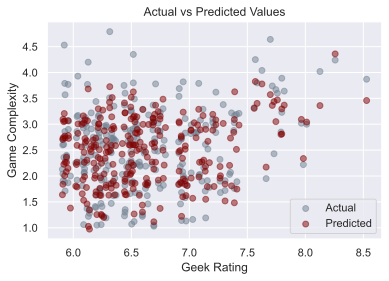

In [648]:
# quick reg plot
plt.title('Actual vs Predicted Values')
plt.xlabel('Geek Rating')
plt.ylabel('Game Complexity')
# plt.legend(['Actual', 'Predicted'])

plt.scatter(x_poly_test['geek_rtg'],y_poly_test, c='slategrey', alpha=.5, label='Actual')
plt.scatter(x_poly_test['geek_rtg'],y_test_pred, c='maroon', alpha=.5, label='Predicted')
plt.legend(loc="lower right")
;